# SNP mapping and enumeration

The goal of this code is to analyze the distribution of non-WT nucleotides in the original plasmid pool from error prone PCR, and how those positions change after minigenome replication assays with, and without, NS2. Figures for publication and detailed analysis in companion notebook, "Manuscript_Figures.ipynb".

5' RACE to infer ends analyzed in latter half of this notebook, and is performed with a few slight differences than the standard subamplicon sequencing in the first half of this notebook. Data combined for representation in the companion notebook.

## Subamplicon (non-RACE) positions

Loading scripts, setting key variables.

In [1]:

import os
import sys
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
import pandas as pd
%matplotlib inline
scripts = 'Scripts'

import seaborn as sns
import glob
sys.path.append(scripts)
import fastQHandling
import mutCalling
#Directory with fastq files for this stage
sequenceDirectory = "Sequencing/SNPamplicon/"
#fasta of sequence to be mapped against. Includes anadapter used during amplification to improve mapping. This region ignored in subsequent
#analysis
genomeFA = 'Database/PB1del_adapt.fa'
#STAR index, to be generated if it doesnt exist already
genome = 'Database/PB1del_adaptSTAR'
#adapters for trimmomatic
adapterFile = 'Database/adapter.fa'
#place to store processed data
resultsDir = 'Results'
if not os.path.isdir(resultsDir):
    os.mkdir(resultsDir)
#multiprocessing for mapping to speed things up a bit
from multiprocessing import Pool
numProcessors = 6
import subprocess
figureDirectory = 'SuppFigures/'
if not os.path.isdir(figureDirectory):
    os.mkdir(figureDirectory)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams.update({'font.size': 16, 'axes.titlesize':'medium',})
sns.set_style("white")
sns.set_style("ticks")
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")
colormap = 'colorblind'
colors = sns.color_palette(colormap, 8)


import numpy as np
#give a position unique to an amplicon, and which bases should be ignored. Could try trimming, but this is a bit more direct.
#Reasoning-primers-binding positions do not represent actual diversity, and so must be ignored within each amplicon. 
#Experimental design includes overlap, such that these regions are appropriately called by a neighboring amplicon.
ignorePositions = {tuple(np.arange(1,127,1)):tuple(np.concatenate([np.arange(1,29,1), np.arange(149,169,1)])),
                   tuple(np.arange(170,276,1)):tuple(np.concatenate([np.arange(129,149,1), np.arange(298,318,1)])),
                   tuple(np.arange(319,424,1)):tuple(np.concatenate([np.arange(278,298,1), np.arange(446,466,1)])),
                   tuple(np.arange(469,556,1)):tuple(np.concatenate([np.arange(426,446,1), np.arange(559,592,1)]))}


Assess what sequencing files are present, get organized.

In [2]:
experiments = []
for file in glob.glob(sequenceDirectory + '/*.fastq.gz'):
    fileName = file.split('/')[-1]
    descriptors = fileName.split('-')
    replicate = descriptors[2]
    experiment = descriptors[-1].split('_')[0]
    read = descriptors[-1].split('_')[-2]
    experiments += [pd.DataFrame({'replicate':[replicate], 'experiment':experiment,
                                  'read_pair':[read], 
                                  'file_name':[file]})]
experiments = pd.concat(experiments).reset_index().drop(columns=['index'])
unique = experiments.groupby([ 'replicate', 'experiment']).file_name.apply(list).reset_index()
experiments.set_index(['replicate','experiment']).sort_values(['experiment','replicate','read_pair'])

read_pair  \
replicate experiment             
1         noNEP             R1   
          noNEP             R2   
2         noNEP             R1   
          noNEP             R2   
3         noNEP             R1   
          noNEP             R2   
1         plas              R1   
          plas              R2   
2         plas              R1   
          plas              R2   
3         plas              R1   
          plas              R2   
1         withNEP           R1   
          withNEP           R2   
2         withNEP           R1   
          withNEP           R2   
3         withNEP           R1   
          withNEP           R2   

                                                              file_name  
replicate experiment                                                     
1         noNEP       Sequencing/SNPamplicon/subAmp-m89-1-minG-noNEP...  
          noNEP       Sequencing/SNPamplicon/subAmp-m89-1-minG-noNEP...  
2         noNEP       Sequencing/SNPamplicon/subAmp-m89-2-minG-noNEP...  
          noNEP       Sequencing/SNPamplicon/subAmp-m89-2-minG-noNEP...  
3         noNEP       Sequencing/SNPamplicon/subAmp-m89-3-minG-noNEP...  
          noNEP       Sequencing/SNPamplicon/subAmp-m89-3-minG-noNEP...  
1         plas        Sequencing/SNPamplicon/subAmp-m89-1-minG-plas_...  
          plas        Sequencing/SNPamplicon/subAmp-m89-1-minG-plas_...  
2         plas        Sequencing/SNPamplicon/subAmp-m89-2-minG-plas_...  
          plas        Sequencing/SNPamplicon/subAmp-m89-2-minG-plas_...  
3         plas        Sequencing/SNPamplicon/subAmp-m89-3-minG-plas_...  
          plas        Sequencing/SNPamplicon/subAmp-m89-3-minG-plas_...  
1         withNEP     Sequencing/SNPamplicon/subAmp-m89-1-minG-withN...  
          withNEP     Sequencing/SNPamplicon/subAmp-m89-1-minG-withN...  
2         withNEP     Sequencing/SNPamplicon/subAmp-m89-2-minG-withN...  
          withNEP     Sequencing/SNPamplicon/subAmp-m89-2-minG-withN...  
3         withNEP     Sequencing/SNPamplicon/subAmp-m89-3-minG-withN...  
          withNEP     Sequencing/SNPamplicon/subAmp-m89-3-minG-withN...

fastQC on sequences

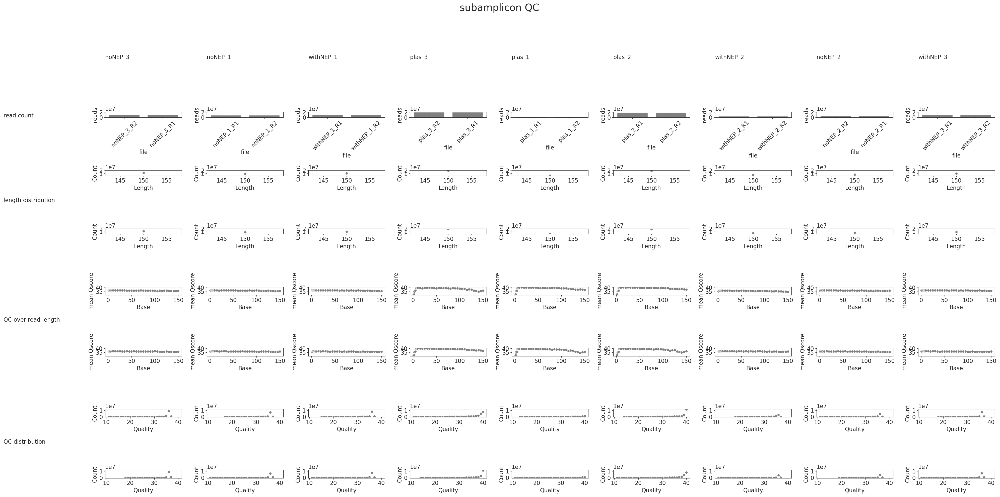

In [61]:

def fastQC(tupleArgument):
    sampleName = tupleArgument[0]
    reads = tupleArgument[1]
    return {sampleName:fastQHandling.fastQCreport(sampleName=sampleName, reads=reads)}
figsDisplay = []
reports = []
results = {}
samples = {}
for index, row in experiments.iterrows():
    sample = '_'.join([str(row.experiment),str(row.replicate)])
    read = row.file_name
    readName = sample + '_' + row.read_pair
    if sample not in samples.keys():
        samples[sample] = {readName:read}
    else:
        samples[sample][readName] = read
popList = [(sample, samples[sample]) for sample in list(samples.keys())]
while len(popList) > 0:
    with Pool(processes = numProcessors) as p:
        reports += p.map(fastQC, [popList.pop() for i in range(numProcessors) if len(popList) != 0])
reports = {key:value for dictionary in reports for key, value in dictionary.items()} 
a = fastQHandling.graphAllTheThings(data=reports, title='subamplicon QC')
#pdf for publication
plt.savefig(sequenceDirectory + '/sequenceQC.pdf', format='pdf', bbox_inches = "tight")
#png for showing here
plt.savefig(sequenceDirectory + '/sequenceQC.png', format='png', bbox_inches = "tight")
plt.close()
figsDisplay += [sequenceDirectory + '/sequenceQC.png']
width = 128 * len(figsDisplay)
g = plt.figure(1, (width, 128))
spec = g.add_gridspec(ncols= len(figsDisplay),nrows=1)
for column, fig in enumerate(figsDisplay):
    ax = g.add_subplot(spec[0,column])
    img=mpimg.imread(fig)
    ax.imshow(img)
    ax.axis('off')


Read trimming

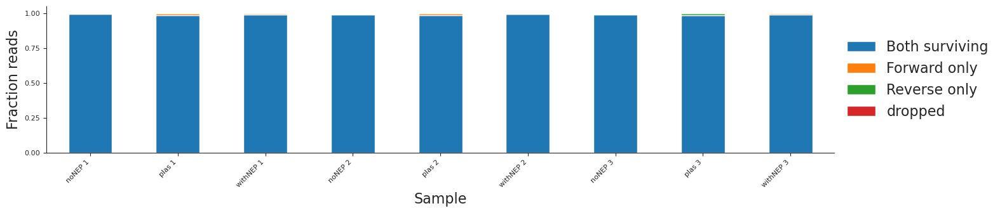

In [62]:
if not os.path.isdir(sequenceDirectory + 'trimmed_reads'):
    os.mkdir(sequenceDirectory + 'trimmed_reads')


rows = experiments.groupby([ 'replicate', 'experiment']).file_name.apply(list).reset_index().iterrows()
stats = pd.concat([fastQHandling.trimCommandPaired(read1=row[1].file_name[0], 
                           read2= row[1].file_name[1],
                           outDirectory=sequenceDirectory + 'trimmed_reads/',
                            adapterFile= adapterFile,
                            sampleName = ' '.join([row[1].experiment, str(row[1].replicate)]),
                          threads = numProcessors) for row in rows]).set_index('Sample')
#return raw numbers from above as they are generally more useful, but go ahead and collapse to percentages here
stats=stats.div(stats['Input read pairs'], axis=0).drop(columns=['Input read pairs'])
ax = stats.loc[:,['Both surviving', 'Forward only', 'Reverse only', 'dropped']].plot.bar(stacked=True,figsize=(16,3), fontsize=8)
sns.despine()
ax.legend( loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.xticks(rotation=45,horizontalalignment="right")
plt.ylabel('Fraction reads', fontsize=16)
plt.savefig(sequenceDirectory + '/trimming_statistics.pdf', format='pdf', bbox_inches = "tight")

Generate genome file if not pre-existing

In [63]:
if not os.path.isdir(genome):
    store = !STAR --runMode genomeGenerate --runThreadN 1 --genomeDir $genome --genomeFastaFiles $genomeFA --genomeSAindexNbases 3 


In [ ]:
outDirectory = resultsDir + '/STARalignSNPampl'
if not os.path.isdir(outDirectory):
    os.mkdir(outDirectory)
for index, row in experiments.groupby(['replicate', 'experiment']).file_name.apply(list).reset_index().iterrows():
    read1 = row.file_name[0]
    read2 = row.file_name[1]
    R1 = ['/'.join(read1.split('/')[:-1]) + '/trimmed_reads/' +read1.split('/')[-1]]
    R2 = ['/'.join(read2.split('/')[:-1]) + '/trimmed_reads/' +read2.split('/')[-1]]
    outprefix = outDirectory + '/' + str(row.experiment) + '-' + str(row.replicate)
    for read in R1 + R2:
        unzipped = read[:-3]
        !gunzip -c $read > $unzipped
    read1unzip = ','.join([read[:-3] for read in R1])
    read2unzip = ','.join([read[:-3] for read in R2])
    logFile =  outprefix + 'terminal.txt'
    capture = !STAR --runMode alignReads --runThreadN $numProcessors --genomeDir $genome --readFilesIn $read1unzip $read2unzip --outFileNamePrefix $outprefix --outSAMtype BAM Unsorted --alignIntronMax 1 --alignEndsType EndToEnd --outFilterMismatchNmax 999 --outFilterMismatchNoverReadLmax 0.1
    with open(logFile, 'w') as outfile:
        for line in capture:
            outfile.write(line + '\n')


    for read in R1 + R2:
        unzipped = read[:-3]
        !rm -f $unzipped

Maprate, demonstrating no issues with any of the samples

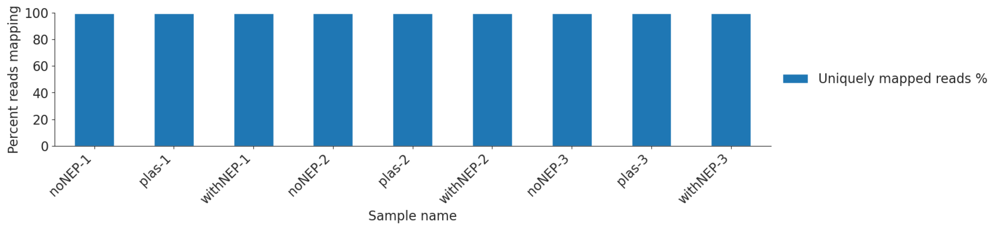

In [4]:
data = []
figsDisplay = []

for index, row in unique.iterrows():
    sampleName =  str(row.experiment) + '-' + \
           str(row.replicate) 
    filename = resultsDir + '/STARalignSNPampl/' + sampleName + 'Log.final.out'
    data += [fastQHandling.STARreport(filename,sampleName)]

data = pd.concat(data)
data.loc[:,['Uniquely mapped reads %','Sample name']].set_index('Sample name').plot.bar(stacked=True,figsize=(16,3), fontsize=16)
sns.despine()
plt.legend( loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.xticks(rotation=45,horizontalalignment="right")
plt.ylabel('Percent reads mapping', fontsize=16)
plt.ylim(0,100)
plt.savefig(resultsDir + '/STARalignSNPampl/alignment.pdf', format='pdf', bbox_inches = "tight")
#png for showing here
plt.savefig(resultsDir + '/STARalignSNPampl/alignment.png', format='png', bbox_inches = "tight")
plt.close()
figsDisplay += [resultsDir + '/STARalignSNPampl/alignment.png']
width = 64 * len(figsDisplay)
g = plt.figure(1, (width, 32))
spec = g.add_gridspec(ncols= len(figsDisplay),nrows=1)
for column, fig in enumerate(figsDisplay):
    ax = g.add_subplot(spec[0,column])
    img=mpimg.imread(fig)
    ax.imshow(img)
    ax.axis('off')

Genereate a per-position table of nucleotides observed with a reasonable qvalue cutoff (30)

In [ ]:
def rawSeqMaps(arguments):
    mutCalling.positionalDataTrim(sortedBamfile = arguments[0],outfile=arguments[1],
                               qvalCutoff=arguments[2], ignorePos=ignorePositions)


popList = []
if not os.path.isdir(resultsDir + '/SNPcounts/'):
    os.mkdir(resultsDir + '/SNPcounts/')
for index, row in unique.iterrows():
    outDirectory = resultsDir + '/SNPcounts/'
    sampleName = str(row.experiment) + '-' + str(row.replicate) 
    bamfile = resultsDir + '/STARalignSNPampl/' + sampleName + 'Aligned.out.bam'
    outfile = outDirectory + sampleName + '_SNP.tsv'
    popList.append((bamfile, outfile, 30))

while len(popList) > 0:
    with Pool(processes = numProcessors) as p:
        output = p.map(rawSeqMaps, [popList.pop() for i in range(numProcessors) if len(popList) != 0] )

Further assessment of these data will be in appropriate folder

## Analysis of RACE data

In [2]:
sequenceDirectory = "Sequencing/SNPRACE/"
#fasta of sequence to be mapped against. Includes an adapter used during amplification to improve mapping. This region ignored in subsequent
#analysis
genomeFA = 'Database/PB1del_adapt_TSO.fa'
#STAR index, to be generated if it doesnt exist already
genome = 'Database/PB1del_adapt_TSO'
#adapters for trimmomatic
adapterFile = 'Database/adapter.fa'
#place to store processed data
capThreshold = 2

#plasmid specific
genomeFAplas = 'Database/ampliseqplas.fa'
genomeplas = 'Database/ampliseqplas'



Gather annotations for RACE data

In [3]:
experiments = []
for file in glob.glob(sequenceDirectory + '/*.fastq.gz'):
    fileName = file.split('/')[-1]
    descriptors = fileName.split('-')
    replicate = descriptors[2]
    experiment = descriptors[-1].split('_')[0]
    read = descriptors[-1].split('_')[-2]
    experiments += [pd.DataFrame({'replicate':[replicate], 'experiment':experiment,
                                  'read_pair':[read], 
                                  'file_name':[file]})]
experiments = pd.concat(experiments).reset_index().drop(columns=['index'])
unique = experiments.groupby([ 'replicate', 'experiment']).file_name.apply(list).reset_index()
experiments.set_index(['replicate','experiment']).sort_values(['experiment','replicate','read_pair'])

read_pair  \
replicate experiment             
1         noNEP             R1   
          noNEP             R2   
2         noNEP             R1   
          noNEP             R2   
3         noNEP             R1   
          noNEP             R2   
1         plas              R1   
          plas              R2   
2         plas              R1   
          plas              R2   
3         plas              R1   
          plas              R2   
1         withNEP           R1   
          withNEP           R2   
2         withNEP           R1   
          withNEP           R2   
3         withNEP           R1   
          withNEP           R2   

                                                              file_name  
replicate experiment                                                     
1         noNEP       Sequencing/SNPRACE/RACE-m89-1-minG-noNEP_R1_00...  
          noNEP       Sequencing/SNPRACE/RACE-m89-1-minG-noNEP_R2_00...  
2         noNEP       Sequencing/SNPRACE/RACE-m89-2-minG-noNEP_R1_00...  
          noNEP       Sequencing/SNPRACE/RACE-m89-2-minG-noNEP_R2_00...  
3         noNEP       Sequencing/SNPRACE/RACE-m89-3-minG-noNEP_R1_00...  
          noNEP       Sequencing/SNPRACE/RACE-m89-3-minG-noNEP_R2_00...  
1         plas        Sequencing/SNPRACE/RACE-m89-1-minG-plas_R1_001...  
          plas        Sequencing/SNPRACE/RACE-m89-1-minG-plas_R2_001...  
2         plas        Sequencing/SNPRACE/RACE-m89-2-minG-plas__R1_00...  
          plas        Sequencing/SNPRACE/RACE-m89-2-minG-plas_R2_001...  
3         plas        Sequencing/SNPRACE/RACE-m89-3-minG-plas_R1_001...  
          plas        Sequencing/SNPRACE/RACE-m89-3-minG-plas_R2_001...  
1         withNEP     Sequencing/SNPRACE/RACE-m89-1-minG-withNEP_R1_...  
          withNEP     Sequencing/SNPRACE/RACE-m89-1-minG-withNEP_R2_...  
2         withNEP     Sequencing/SNPRACE/RACE-m89-2-minG-withNEP_R1_...  
          withNEP     Sequencing/SNPRACE/RACE-m89-2-minG-withNEP_R2_...  
3         withNEP     Sequencing/SNPRACE/RACE-m89-3-minG-withNEP_R1_...  
          withNEP     Sequencing/SNPRACE/RACE-m89-3-minG-withNEP_R2_...

fastQC as before

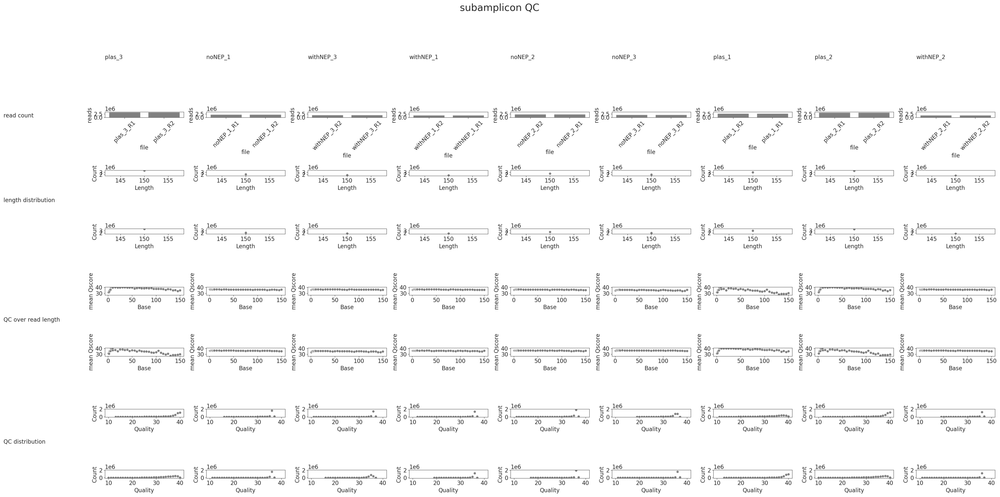

In [4]:

def fastQC(tupleArgument):
    sampleName = tupleArgument[0]
    reads = tupleArgument[1]
    return {sampleName:fastQHandling.fastQCreport(sampleName=sampleName, reads=reads)}
figsDisplay = []
reports = []
results = {}
samples = {}
for index, row in experiments.iterrows():
    sample = '_'.join([str(row.experiment),str(row.replicate)])
    read = row.file_name
    readName = sample + '_' + row.read_pair
    if sample not in samples.keys():
        samples[sample] = {readName:read}
    else:
        samples[sample][readName] = read
popList = [(sample, samples[sample]) for sample in list(samples.keys())]
while len(popList) > 0:
    with Pool(processes = numProcessors) as p:
        reports += p.map(fastQC, [popList.pop() for i in range(numProcessors) if len(popList) != 0])
reports = {key:value for dictionary in reports for key, value in dictionary.items()} 
a = fastQHandling.graphAllTheThings(data=reports, title='subamplicon QC')
#pdf for publication
plt.savefig(sequenceDirectory + '/sequenceQC.pdf', format='pdf', bbox_inches = "tight")
#png for showing here
plt.savefig(sequenceDirectory + '/sequenceQC.png', format='png', bbox_inches = "tight")
plt.close()
figsDisplay += [sequenceDirectory + '/sequenceQC.png']
width = 128 * len(figsDisplay)
g = plt.figure(1, (width, 128))
spec = g.add_gridspec(ncols= len(figsDisplay),nrows=1)
for column, fig in enumerate(figsDisplay):
    ax = g.add_subplot(spec[0,column])
    img=mpimg.imread(fig)
    ax.imshow(img)
    ax.axis('off')


Generate star index if not pre-existing as before

In [5]:
if not os.path.isdir(genome):
    store = !STAR --runMode genomeGenerate --runThreadN 1 --genomeDir $genome --genomeFastaFiles $genomeFA --genomeSAindexNbases 3 
if not os.path.isdir(genomeplas):
    store = !STAR --runMode genomeGenerate --runThreadN 1 --genomeDir $genomeplas --genomeFastaFiles $genomeFAplas --genomeSAindexNbases 3 


Mapping. For plasmid samples, map to a slightly different map.

In [9]:
outDirectory = resultsDir + '/STARalignSNPRACE'

for index, row in experiments.pivot_table(values = 'file_name', index = ['replicate','experiment'], columns = ['read_pair'], aggfunc='sum').reset_index().iterrows():
    read1 = row.R1
    read2 = row.R2
    R1 = ['/'.join(read1.split('/')[:-1]) + '/' +read1.split('/')[-1]]
    R2 = ['/'.join(read2.split('/')[:-1]) + '/' +read2.split('/')[-1]]
    outprefix = outDirectory + '/' + str(row.experiment) + '-' + str(row.replicate)
    outprefix = outDirectory + '/' + str(row.experiment) + '-' + str(row.replicate)
    for read in R1 + R2:
        unzipped = read[:-3]
        !gunzip -c $read > $unzipped
    read1unzip = ','.join([read[:-3] for read in R1])
    read2unzip = ','.join([read[:-3] for read in R2])
    r1out = read1unzip[:-6] + '_uncapped.fastq'
    r2out = read2unzip[:-6] + '_uncapped.fastq'
    logFile =  outprefix + 'terminal.txt'
    if row.experiment != 'plas':
        seqs = ['AAGCAGTGGTATCAACGCAGAGTACATGGGAGCGAAAGCAGGCAAACCAT','AAGCAGTGGTATCAACGCAGAGTACATGGGAGTAGAAACAAGGCATTTTT']
        mutCalling.cappedExclude(searchSeqs = seqs, R1in=read1unzip,R2in=read2unzip,R1out=r1out,R2out=r2out,toleratedDifs=5)
        !rm -f $read1unzip
        !rm -f $read2unzip  
    else:
        seqs = ['AAGCAGTGGTATCAACGCAGAGTCGGAGTACTGGTCGACCTCCGAAGTTGGGGGGGAGCGAAAGCAGGCAAACCAT','AAGCAGTGGTATCAACGCAGAGTCTCCGAGTCGGCATTTTGGGCCGCCGGGTTATTAGTAGAAACAAGGCATTTTT']
        mutCalling.cappedExclude(searchSeqs = seqs, R1in=read1unzip,R2in=read2unzip,R1out=r1out,R2out=r2out,toleratedDifs=4)
        !rm -f $read1unzip
        !rm -f $read2unzip  





In [10]:
outDirectory = resultsDir + '/STARalignSNPRACE'
if not os.path.isdir(outDirectory):
    os.mkdir(outDirectory)
for index, row in experiments.pivot_table(values = 'file_name', index = ['replicate','experiment'], columns = ['read_pair'], aggfunc='sum').reset_index().iterrows():
    read1 = row.R1
    read2 = row.R2
    R2 = ['/'.join(read1.split('/')[:-1]) + '/' +read1.split('/')[-1]]
    R1 = ['/'.join(read2.split('/')[:-1]) + '/' +read2.split('/')[-1]]
    outprefix = outDirectory + '/' + str(row.experiment) + '-' + str(row.replicate)

    read1unzip = ','.join([read[:-3] for read in R1])
    read2unzip = ','.join([read[:-3] for read in R2])
    r1out = read1unzip[:-6] + '_uncapped.fastq'
    r2out = read2unzip[:-6] + '_uncapped.fastq'
    logFile =  outprefix + 'terminal.txt'
    if row.experiment != 'plas':
        capture = !STAR --runMode alignReads --runThreadN $numProcessors --genomeDir $genome --readFilesIn $r1out $r2out --outFileNamePrefix $outprefix --outSAMtype BAM Unsorted --alignIntronMax 1 --alignEndsType EndToEnd --outFilterMismatchNmax 999 --outFilterMismatchNoverReadLmax 0.1
    else:
        capture = !STAR --runMode alignReads --runThreadN $numProcessors --genomeDir $genomeplas --readFilesIn $r1out $r2out --outFileNamePrefix $outprefix --outSAMtype BAM Unsorted --alignIntronMax 1 --alignEndsType EndToEnd --outFilterMismatchNmax 999 --outFilterMismatchNoverReadLmax 0.1
    with open(logFile, 'w') as outfile:
        for line in capture:
            outfile.write(line + '\n')


Map statistics

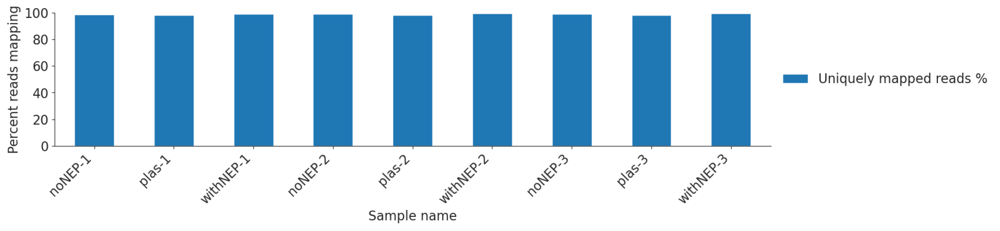

In [11]:

data = []
figsDisplay = []

for index, row in unique.iterrows():
    sampleName =  str(row.experiment) + '-' + \
           str(row.replicate) 
    filename = resultsDir + '/STARalignSNPRACE/' + sampleName + 'Log.final.out'
    data += [fastQHandling.STARreport(filename,sampleName)]

data = pd.concat(data)
data.loc[:,['Uniquely mapped reads %','Sample name']].set_index('Sample name').plot.bar(stacked=True,figsize=(16,3), fontsize=16)
sns.despine()
plt.legend( loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.xticks(rotation=45,horizontalalignment="right")
plt.ylabel('Percent reads mapping', fontsize=16)
plt.ylim(0,100)
plt.savefig(resultsDir + '/STARalignSNPRACE/alignment.pdf', format='pdf', bbox_inches = "tight")
#png for showing here
plt.savefig(resultsDir + '/STARalignSNPRACE/alignment.png', format='png', bbox_inches = "tight")
plt.close()
figsDisplay += [resultsDir + '/STARalignSNPRACE/alignment.png']
width = 64 * len(figsDisplay)
g = plt.figure(1, (width, 32))
spec = g.add_gridspec(ncols= len(figsDisplay),nrows=1)
for column, fig in enumerate(figsDisplay):
    ax = g.add_subplot(spec[0,column])
    img=mpimg.imread(fig)
    ax.imshow(img)
    ax.axis('off')

Assigning nucleotides. Remove clearly capped species.

In [12]:
def rawSeqMaps(arguments):
    mutCalling.positionalDataIgnoreInsert(sortedBamfile = arguments[0],outfile=arguments[1],
                               qvalCutoff=arguments[2], insertionCutoff=capThreshold)


popList = []
if not os.path.isdir('Results/SNPcounts'):
    os.mkdir('Results/SNPcounts')
for index, row in unique.iterrows():
    outDirectory = 'Results/SNPcounts/'
    sampleName = str(row.experiment) + '-' + str(row.replicate) 
    bamfile = 'Results/STARalignSNPRACE/' + sampleName + 'Aligned.out.bam'
    outfile = outDirectory + 'RACE_' + sampleName + '_SNP.tsv'
    popList.append((bamfile, outfile, 30))

while len(popList) > 0:
    with Pool(processes = numProcessors) as p:
        output = p.map(rawSeqMaps, [popList.pop() for i in range(numProcessors) if len(popList) != 0] )